**Importing Libraries**

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output, display, Image
import imageio

**Download Images**

In [2]:
image_dir="images"
!mkdir {image_dir}

!wget -q https://cdn.pixabay.com/photo/2018/07/14/15/27/cafe-3537801_1280.jpg -O ./images/cafe.jpg
!wget -q https://cdn.pixabay.com/photo/2017/02/28/23/00/swan-2107052_1280.jpg -O ./images/swan.jpg
!wget -q https://i.dawn.com/large/2019/10/5db6a03a4c7e3.jpg -O ./images/tnj.jpg
!wget -q https://cdn.pixabay.com/photo/2015/09/22/12/21/rudolph-951494_1280.jpg -O ./images/rudolph.jpg
!wget -q https://cdn.pixabay.com/photo/2015/10/13/02/59/animals-985500_1280.jpg -O ./images/dynamite.jpg
!wget -q https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg -O ./images/painting.jpg

In [3]:
gif_dir="GIF"
!mkdir {gif_dir}

In [4]:
#Viewing the architecture of the VGG19 model

tf.keras.backend.clear_session()
vgg=tf.keras.applications.vgg19.VGG19()
vgg.summary()

del vgg

574710816/574710816 [==============================] - 5s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [5]:
style_layers=["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]
content_layers=["block5_conv2"]
output_layers=style_layers+content_layers

n_style_layers=len(style_layers)
n_content_layers=len(content_layers)

output_layers

['block1_conv1',
 'block2_conv1',
 'block3_conv1',
 'block4_conv1',
 'block5_conv1',
 'block5_conv2']

In [6]:
def vgg_model(output_layers):
  vgg=tf.keras.applications.vgg19.VGG19(weights="imagenet", include_top=False)
  vgg.trainable=False

  input=vgg.input
  outputs=[vgg.get_layer(name).output for name in output_layers]
  model=tf.keras.Model(inputs=input, outputs=outputs)

  return model

In [109]:
# Utilities

def load_image(path_image, max_dim=512):
  image=tf.io.read_file(path_image)
  image=tf.image.decode_jpeg(image)

  #Resizing the image to 512 pixels in its longest dimension
  shape=tf.cast(tf.shape(image), tf.float32)[:-1]
  scale=max_dim/max(shape)
  new_shape=tf.cast(shape*scale, tf.int32)

  image=tf.image.resize(image, new_shape)
  image=tf.expand_dims(image, axis=0)
  image=tf.cast(image, tf.uint8)

  return image


def display_images(content_image, style_image, generated_image=None, titles=[""]*3):
  if generated_image is not None:
    fig, ax = plt.subplots(1, 3, figsize=(15,15))
    ax[2].imshow(generated_image)
    ax[2].set_title(titles[2])
    ax[2].axis("off")
  else:
    fig, ax = plt.subplots(1, 2, figsize=(12,12))

  ax[0].imshow(content_image)
  ax[0].set_title(titles[0])
  ax[0].axis("off")

  ax[1].imshow(style_image)
  ax[1].set_title(titles[1])
  ax[1].axis("off")

  plt.show()


def create_gif(array, style_path, content_path):
  name_style=style_path.split("/")[-1].split(".")[0]
  name_content=content_path.split("/")[-1].split(".")[0]

  writer=imageio.get_writer(f"{gif_dir}/{name_content}_{name_style}.gif", duration=3)
  len_array=len(array)

  for i in range(len_array):
    if (i<2) or ((i+1)%20==0) or (i==len_array-1):
      writer.append_data(array[i])

  writer.close()

**Loss functions**

In [8]:
def get_style_loss(style_feature, style_target):
  loss=tf.reduce_mean(tf.square(style_feature-style_target))
  return loss


def get_content_loss(content_feature, content_target):
  loss=0.5*tf.reduce_mean(tf.square(content_feature-content_target))
  return loss


def gram_matrix(style_feature):
  gram=tf.linalg.einsum("bijc,bijd->bcd", style_feature, style_feature)
  shape=tf.shape(style_feature)
  num_locations=float(shape[1]*shape[2]) #height*width

  return gram/num_locations


def preprocess_image(image):
  image=tf.cast(image, dtype=tf.float32)
  image=tf.keras.applications.vgg19.preprocess_input(image)
  return image

**Get the Style Image Features**

In [9]:
def get_style_image_features(style_generated_image):
  image=preprocess_image(style_generated_image)
  outputs=model(image)
  style_features=outputs[:n_style_layers]
  style_features=[gram_matrix(style_feature) for style_feature in style_features]

  return style_features


def get_content_image_features(content_generated_image):
  image=preprocess_image(content_generated_image)
  outputs=model(image)
  content_features=outputs[n_style_layers:]

  return content_features

In [90]:
def get_total_loss(style_features, style_targets, content_features, content_targets, style_weight, content_weight):

  style_loss=tf.add_n([get_style_loss(style_feature, style_target)
                       for style_feature, style_target in zip(style_features, style_targets)])
  style_loss=style_loss*style_weight / n_style_layers

  content_loss=tf.add_n([get_content_loss(content_feature, content_target)
                         for content_feature, content_target in zip(content_features, content_targets)])
  content_loss=content_loss*content_weight / n_content_layers

  total_loss=style_loss+content_loss

  return total_loss


# Function to calculate gradients
def apply_gradients(generated_image, style_targets, content_targets, optimizer, style_weight, content_weight, var_weight):

  with tf.GradientTape() as tape:
    style_features=get_style_image_features(generated_image)
    content_features=get_content_image_features(generated_image)

    loss=get_total_loss(style_features, style_targets, content_features, content_targets, style_weight, content_weight)

    #Add the total variation loss
    loss+=var_weight*tf.image.total_variation(generated_image)

  gradients=tape.gradient(loss, generated_image)
  optimizer.apply_gradients([(gradients, generated_image)])
  generated_image.assign(tf.clip_by_value(generated_image, clip_value_min=0, clip_value_max=255))


def image_numpy(image):
  image=tf.cast(tf.squeeze(image), dtype=tf.uint8).numpy()
  return image

**Style Transfer**

In [11]:
def fit_style_transfer(style_image, content_image, optimizer, epochs, steps_per_epoch,
                       style_weight=1e-2, content_weight=1e-4, var_weight=0):

  images=[]
  style_targets=get_style_image_features(style_image)
  content_targets=get_content_image_features(content_image)

  generated_image=tf.cast(content_image, dtype=tf.float32)
  generated_image=tf.Variable(generated_image)

  images.append(image_numpy(generated_image))

  for epoch in range(1, epochs+1):
    for step in range(1, steps_per_epoch+1):

      apply_gradients(generated_image, style_targets, content_targets, optimizer,
                      style_weight, content_weight, var_weight)

      print(".", end="")

      if step%10==0:
        images.append(image_numpy(generated_image))

    clear_output(wait=True)
    plt.imshow(image_numpy(generated_image))
    plt.axis("off")
    plt.show()

    print(f"Epoch {epoch} / Train step: {step}")

  return np.array(images)

In [91]:
# Build the model
tf.keras.backend.clear_session()
model=vgg_model(output_layers)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

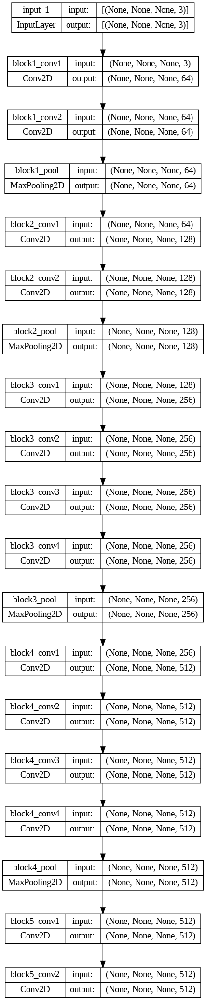

In [92]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

In [93]:
model.output

[<KerasTensor: shape=(None, None, None, 64) dtype=float32 (created by layer 'block1_conv1')>,
 <KerasTensor: shape=(None, None, None, 128) dtype=float32 (created by layer 'block2_conv1')>,
 <KerasTensor: shape=(None, None, None, 256) dtype=float32 (created by layer 'block3_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block4_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block5_conv1')>,
 <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block5_conv2')>]

In [94]:
content_path=f"{image_dir}/swan.jpg"
style_path=f"{image_dir}/painting.jpg"

In [95]:
content_image=load_image(content_path)
style_image=load_image(style_path)

In [96]:
content_image.shape, style_image.shape

(TensorShape([1, 292, 512, 3]), TensorShape([1, 336, 512, 3]))

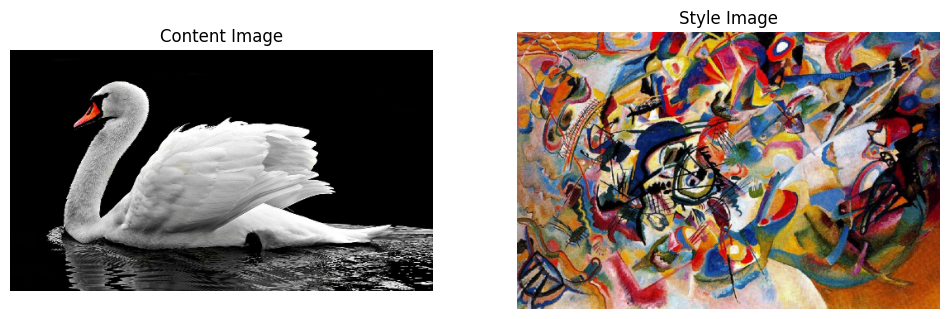

In [114]:
display_images(tf.squeeze(content_image), tf.squeeze(style_image), titles=["Content Image", "Style Image"])

In [98]:
style_weight= 2e-2
content_weight=1e-2
var_weight=0

optimizer=tf.keras.optimizers.Adam(tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=20.0, decay_steps=100, decay_rate=0.5))
epochs=10
steps_per_epoch=100

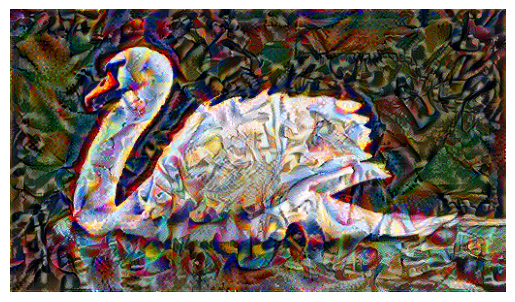

Epoch 10 / Train step: 100


In [99]:
images=fit_style_transfer(style_image, content_image, optimizer, epochs, steps_per_epoch,
                          style_weight, content_weight, var_weight)

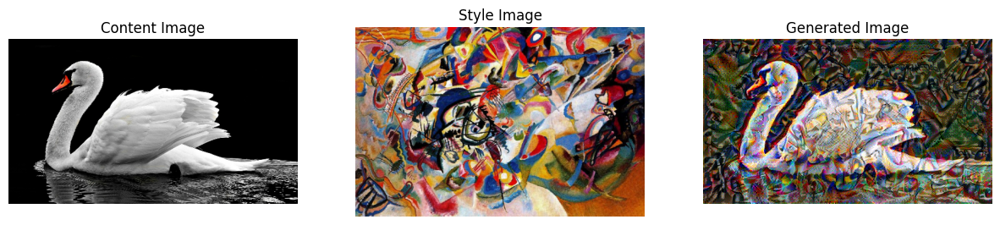

In [115]:
display_images(tf.squeeze(content_image), tf.squeeze(style_image), images[-1], titles=["Content Image", "Style Image", "Generated Image"])

In [101]:
len(images)

101

In [102]:
def get_deltas(image):
  image=tf.image.convert_image_dtype(image, tf.float32) #scales values ​​between [0-1]
  x_delta=image[:,1:,:]-image[:,:-1,:]
  y_delta=image[1:,:,:]-image[:-1,:,:]

  x_delta=tf.clip_by_value(2*x_delta+0.5, 0, 1)
  y_delta=tf.clip_by_value(2*y_delta+0.5, 0, 1)

  return x_delta.numpy(), y_delta.numpy()


def plot_deltas(original_x_deltas, original_y_deltas, stylized_x_deltas, stylized_y_deltas):
  fig, ax = plt.subplots(2,2, figsize=(15,8))

  ax[0,0].imshow(original_x_deltas)
  ax[0,0].set_title("Vertical Deltas: Original")
  ax[0,0].axis("off")

  ax[0,1].imshow(original_y_deltas)
  ax[0,1].set_title("Horizontal Deltas: Original")
  ax[0,1].axis("off")

  ax[1,0].imshow(stylized_x_deltas)
  ax[1,0].set_title("Vertical Deltas: Stylized")
  ax[1,0].axis("off")

  ax[1,1].imshow(stylized_y_deltas)
  ax[1,1].set_title("Horizontal Deltas: Stylized")
  ax[1,1].axis("off")

  plt.show()

In [103]:
content_x_deltas, content_y_deltas = get_deltas(images[0])
generated_x_deltas, generated_y_deltas = get_deltas(images[-1])

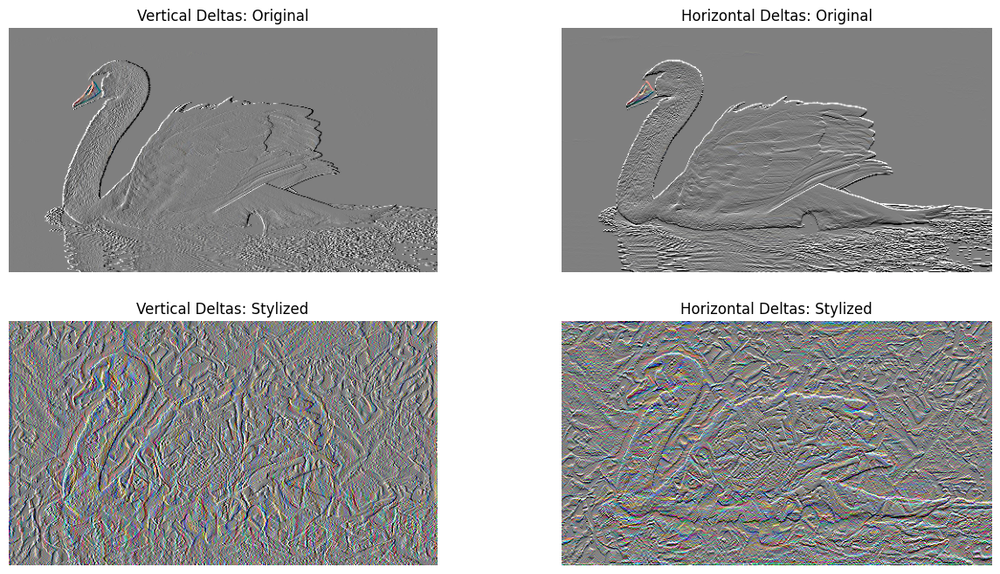

In [104]:
plot_deltas(content_x_deltas, content_y_deltas, generated_x_deltas, generated_y_deltas)

**With Regularization**

In [105]:
tf.keras.backend.clear_session()
model=vgg_model(output_layers)

In [106]:
style_weight= 2e-2
content_weight=1e-2
var_weight=2

optimizer=tf.keras.optimizers.Adam(tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=20.0, decay_steps=100, decay_rate=0.5))
epochs=10
steps_per_epoch=100

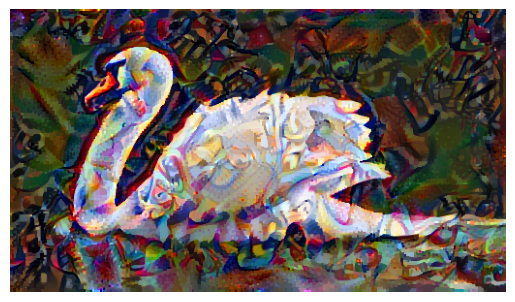

Epoch 10 / Train step: 100


In [107]:
images_regularized=fit_style_transfer(style_image, content_image, optimizer, epochs, steps_per_epoch,
                          style_weight, content_weight, var_weight)

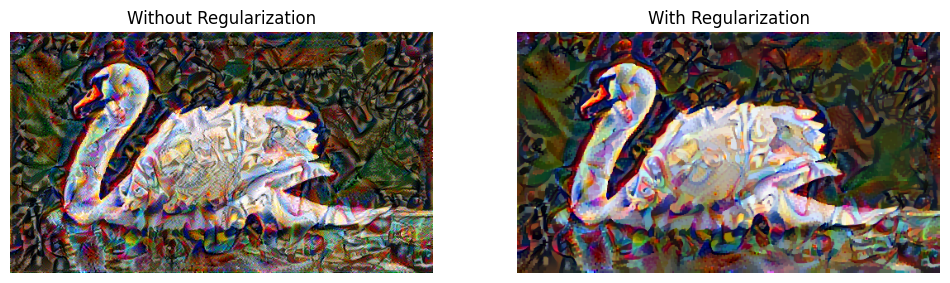

In [116]:
display_images(images[-1], images_regularized[-1], titles=["Without Regularization", "With Regularization"])

In [117]:
create_gif(images_regularized, style_path, content_path)

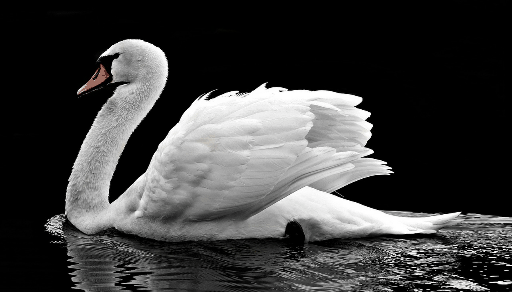

In [118]:
display(Image(filename="GIF/swan_painting.gif"))

---

In [119]:
content_path=f"{image_dir}/tnj.jpg"
style_path=f"{image_dir}/rudolph.jpg"

In [120]:
content_image=load_image(content_path)
style_image=load_image(style_path)

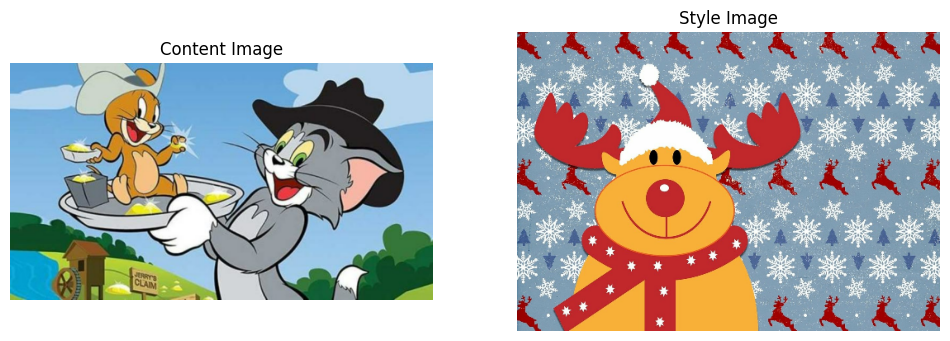

In [121]:
display_images(tf.squeeze(content_image), tf.squeeze(style_image), titles=["Content Image", "Style Image"])

In [122]:
tf.keras.backend.clear_session()
model=vgg_model(output_layers)

In [124]:
style_weight= 2e-2
content_weight=1e-2
var_weight=2

optimizer=tf.keras.optimizers.Adam(tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=20.0, decay_steps=100, decay_rate=0.5))
epochs=10
steps_per_epoch=100

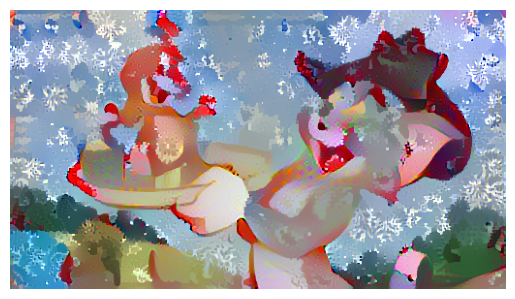

Epoch 10 / Train step: 100


In [125]:
images=fit_style_transfer(style_image, content_image, optimizer, epochs, steps_per_epoch,
                          style_weight, content_weight, var_weight)

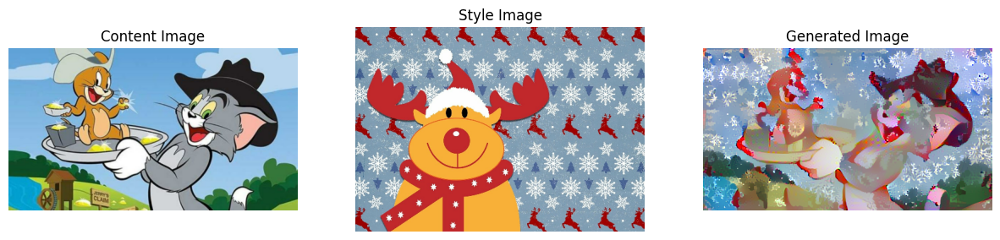

In [126]:
display_images(tf.squeeze(content_image), tf.squeeze(style_image), images[-1], titles=["Content Image", "Style Image", "Generated Image"])

In [127]:
create_gif(images, style_path, content_path)

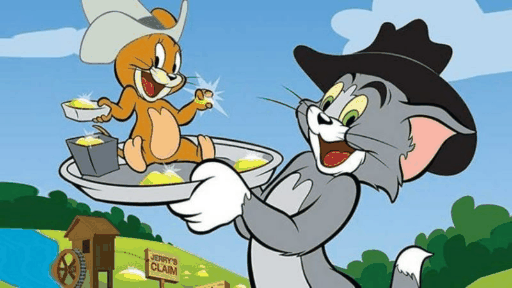

In [128]:
display(Image(filename="/content/GIF/tnj_rudolph.gif"))

---

In [129]:
content_path=f"{image_dir}/dynamite.jpg"
style_path=f"{image_dir}/cafe.jpg"

In [130]:
content_image=load_image(content_path)
style_image=load_image(style_path)

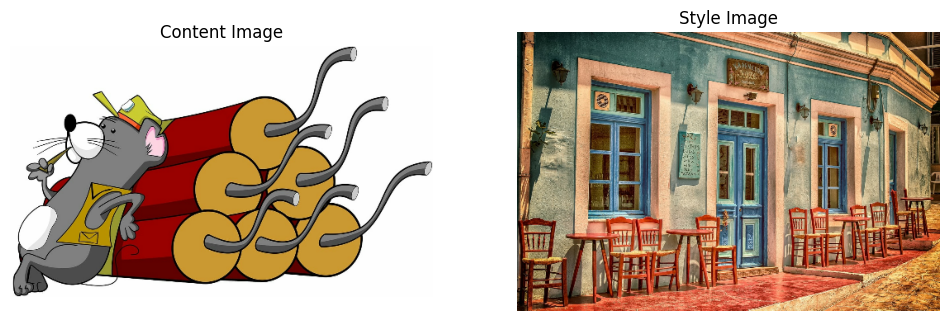

In [131]:
display_images(tf.squeeze(content_image), tf.squeeze(style_image), titles=["Content Image", "Style Image"])

In [132]:
tf.keras.backend.clear_session()
model=vgg_model(output_layers)

In [134]:
style_weight= 2e-2
content_weight=1e-2
var_weight=2

optimizer=tf.keras.optimizers.Adam(tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=20.0, decay_steps=100, decay_rate=0.5))
epochs=10
steps_per_epoch=100

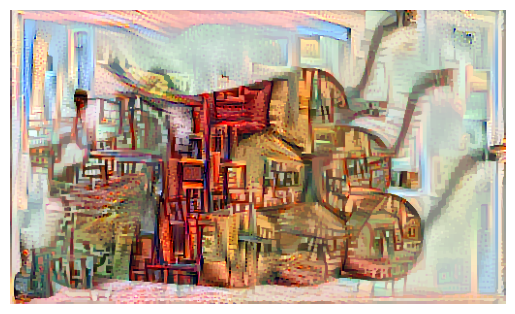

Epoch 10 / Train step: 100


In [135]:
images=fit_style_transfer(style_image, content_image, optimizer, epochs, steps_per_epoch,
                          style_weight, content_weight, var_weight)

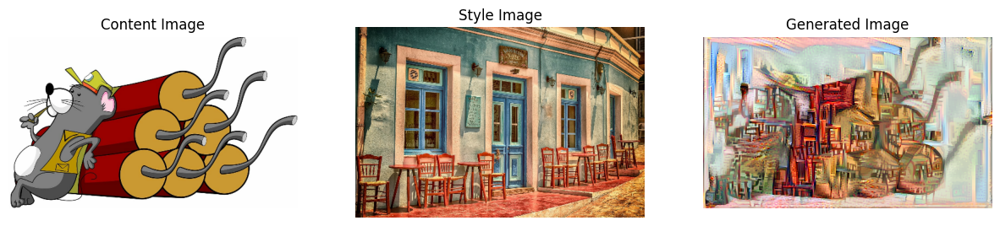

In [136]:
display_images(tf.squeeze(content_image), tf.squeeze(style_image), images[-1], titles=["Content Image", "Style Image", "Generated Image"])

In [137]:
create_gif(images, style_path, content_path)

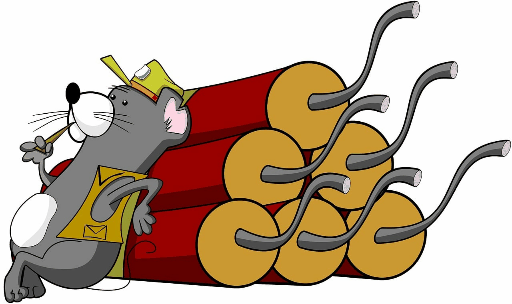

In [139]:
display(Image(filename="/content/GIF/dynamite_cafe.gif"))

---
---
---

### **Fast Neural Style Transfer**

**Imports**

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

**Utilities**

In [3]:
def load_image(path_image, max_dim=512):
  image=tf.io.read_file(path_image)
  image=tf.image.decode_jpeg(image)

  #Resizing the image to 512 pixels in its longest dimension
  shape=tf.cast(tf.shape(image), tf.float32)[:-1]
  scale=max_dim/max(shape)
  new_shape=tf.cast(shape*scale, tf.int32)

  image=tf.image.resize(image, new_shape)
  image=tf.expand_dims(image, axis=0)
  image=tf.cast(image, tf.uint8)

  return image


def display_images(content_image, style_image, generated_image=None, titles=[""]*3):
  if generated_image is not None:
    fig, ax = plt.subplots(1, 3, figsize=(15,15))
    ax[2].imshow(generated_image)
    ax[2].set_title(titles[2])
    ax[2].axis("off")
  else:
    fig, ax = plt.subplots(1, 2, figsize=(12,12))

  ax[0].imshow(content_image)
  ax[0].set_title(titles[0])
  ax[0].axis("off")

  ax[1].imshow(style_image)
  ax[1].set_title(titles[1])
  ax[1].axis("off")

  plt.show()

**Download the images**

In [4]:
image_dir="images"
!mkdir {image_dir}

!wget -q https://cdn.pixabay.com/photo/2018/07/14/15/27/cafe-3537801_1280.jpg -O ./images/cafe.jpg
!wget -q https://cdn.pixabay.com/photo/2017/02/28/23/00/swan-2107052_1280.jpg -O ./images/swan.jpg
!wget -q https://i.dawn.com/large/2019/10/5db6a03a4c7e3.jpg -O ./images/tnj.jpg
!wget -q https://cdn.pixabay.com/photo/2015/09/22/12/21/rudolph-951494_1280.jpg -O ./images/rudolph.jpg
!wget -q https://cdn.pixabay.com/photo/2015/10/13/02/59/animals-985500_1280.jpg -O ./images/dynamite.jpg
!wget -q https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg -O ./images/painting.jpg

In [5]:
model=hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2")

---

In [6]:
content_path=f"{image_dir}/swan.jpg"
style_path=f"{image_dir}/painting.jpg"

In [7]:
content_image=load_image(content_path)
style_image=load_image(style_path)

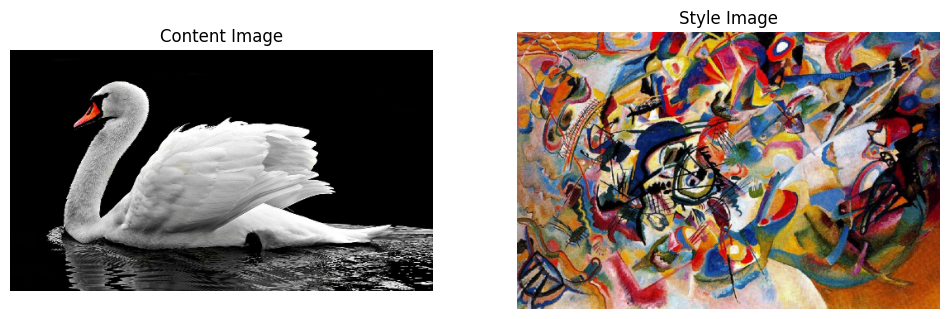

In [8]:
display_images(tf.squeeze(content_image),
               tf.squeeze(style_image),
               titles=["Content Image", "Style Image"])

In [13]:
# Results in a list of tensors
generated_image=model(tf.image.convert_image_dtype(content_image, tf.float32),
                      tf.image.convert_image_dtype(style_image, tf.float32))[0]

In [14]:
generated_image.shape, generated_image.dtype, tf.reduce_min(generated_image), tf.reduce_max(generated_image)

(TensorShape([1, 292, 512, 3]),
 tf.float32,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.015383885>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.99391264>)

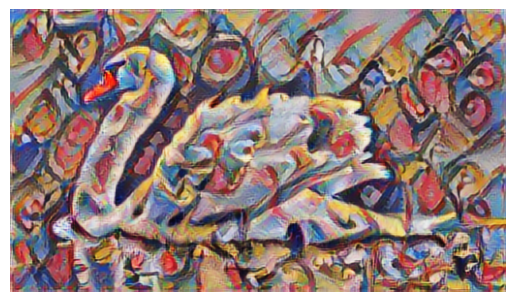

In [22]:
plt.imshow(tf.squeeze(generated_image))
plt.axis("off");

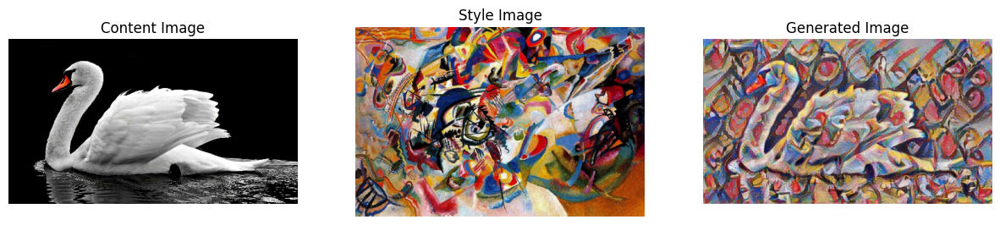

In [17]:
display_images(tf.squeeze(content_image),
               tf.squeeze(style_image),
               tf.squeeze(generated_image),
               titles=["Content Image", "Style Image", "Generated Image"])

---

In [18]:
content_path=f"{image_dir}/tnj.jpg"
style_path=f"{image_dir}/rudolph.jpg"

In [19]:
content_image=load_image(content_path)
style_image=load_image(style_path)

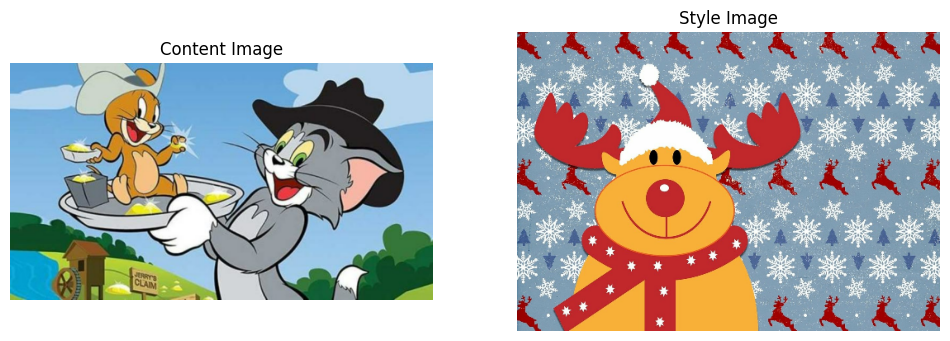

In [23]:
display_images(tf.squeeze(content_image),
               tf.squeeze(style_image),
               titles=["Content Image", "Style Image"])

In [24]:
generated_image=model(tf.image.convert_image_dtype(content_image, tf.float32),
                      tf.image.convert_image_dtype(style_image, tf.float32))[0]

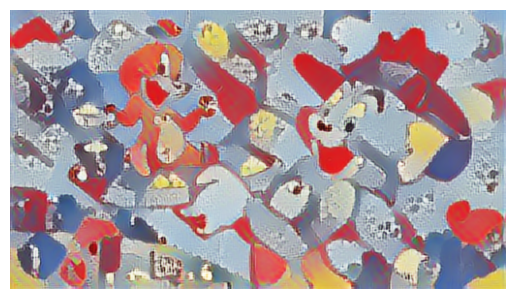

In [25]:
plt.imshow(tf.squeeze(generated_image))
plt.axis("off");

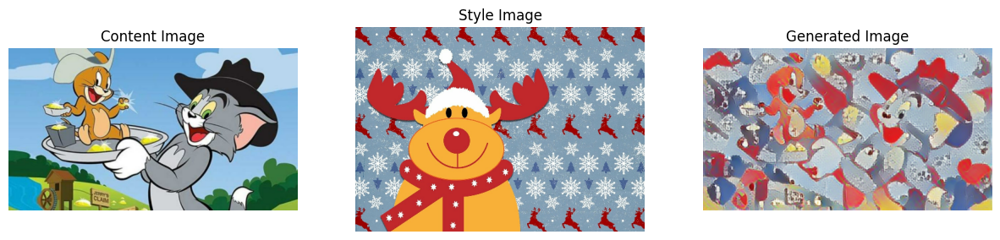

In [26]:
display_images(tf.squeeze(content_image),
               tf.squeeze(style_image),
               tf.squeeze(generated_image),
               titles=["Content Image", "Style Image", "Generated Image"])

---

In [28]:
content_path=f"{image_dir}/dynamite.jpg"
style_path=f"{image_dir}/cafe.jpg"

In [29]:
content_image=load_image(content_path)
style_image=load_image(style_path)

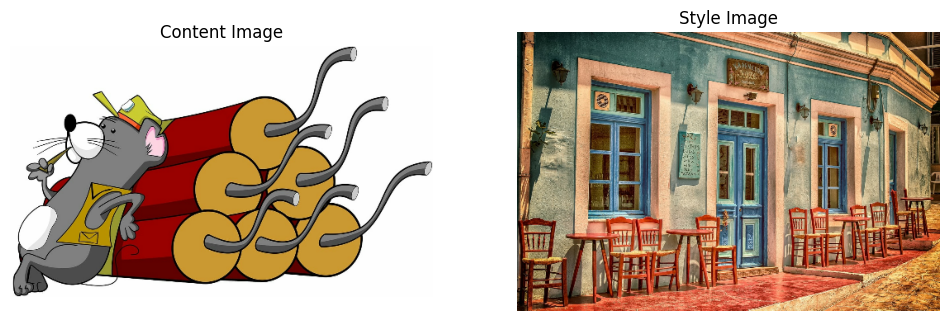

In [30]:
display_images(tf.squeeze(content_image),
               tf.squeeze(style_image),
               titles=["Content Image", "Style Image"])

In [31]:
generated_image=model(tf.image.convert_image_dtype(content_image, tf.float32),
                      tf.image.convert_image_dtype(style_image, tf.float32))[0]

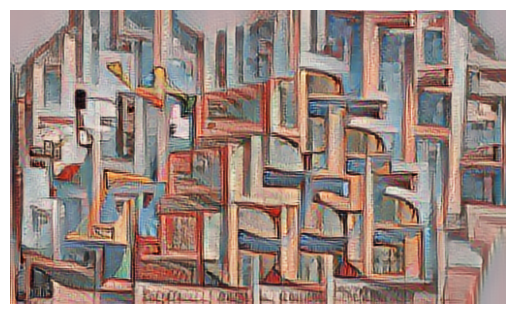

In [32]:
plt.imshow(tf.squeeze(generated_image))
plt.axis("off");

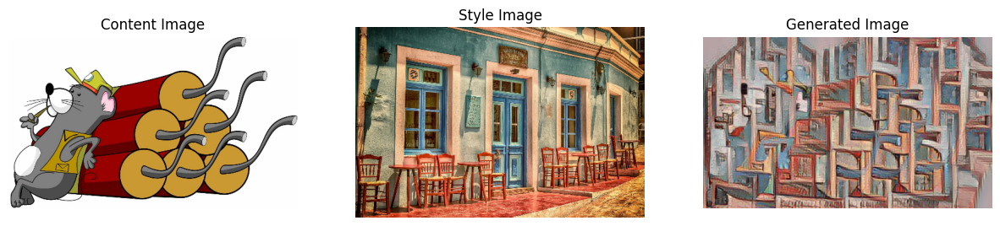

In [33]:
display_images(tf.squeeze(content_image),
               tf.squeeze(style_image),
               tf.squeeze(generated_image),
               titles=["Content Image", "Style Image", "Generated Image"])